# **Flooding Metric Analysis Testing**

In [1]:
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import os
import rasterio
from rasterio.mask import mask
from shapely.geometry import box
import geopandas as gpd
from scipy.ndimage import zoom

# Uncomment these lines if running locally
import sys
sys.path.append("../model")

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

from model import FloodModel
from utils import *

### **Insert the correct paths for the model below**

In [2]:
model_path = '../model/model.onnx'
model = FloodModel(model_path, verbose=False)

# That is the name of every file before the row and the column (Sentinel Downloader's default is 'file')
file_pattern = 'tile'

pop_density_path = '../data/bra_pd_2020_1km_UNadj.tif'

city = "canoas"

# Configuration based on the amount of rows and cols of the tiles of Sentinel-1 images
rows = 3
cols = 3

# The bbox should be in the same format as the output from Sentinel Downloader (maxLAT minLONG, minLAT, maxLONG)
bbox = [-29.8334607725, -51.245041, -29.971442, -51.1070597725] # Canoas

In [3]:
image_folder = f"../data/{city}/s1"
no_flood_folder = f"../data/{city}/s1_no_flood"

output_folder = f"../data/{city}/output"
no_flood_output_folder = f"../data/{city}/output_no_flood"

improved_output_folder = f"../data/{city}/output_improved"
final_output_folder = f"../data/{city}/output_final"

flood_sen2_folder = f"../data/{city}/s2"
no_flood_sen2_folder = f"../data/{city}/s2_no_flood"

Let's test one image to see if the model is working as expected:

In [4]:
output = model.predict(
    os.path.join(image_folder, f'{file_pattern}_0_0.png'), 
    os.path.join(output_folder, f'{file_pattern}_0_0.png')
)

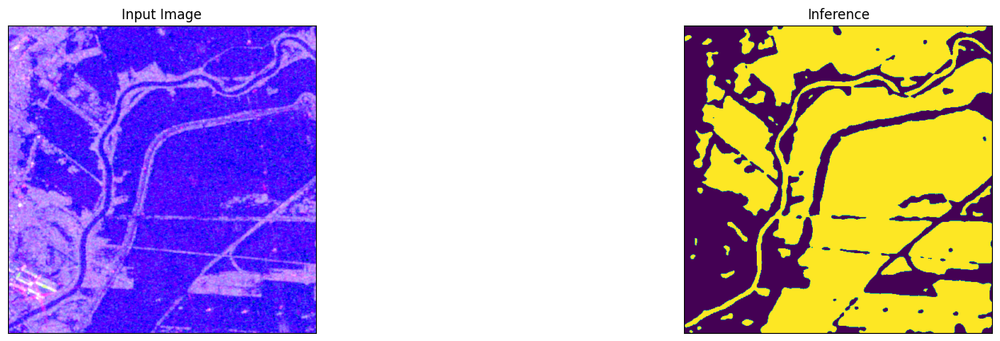

In [5]:
model.plot()

## **Processing all Images**

First, we process the flooded images

In [6]:
for i in range(rows): 
    for j in range(cols): 
        filename = f"{file_pattern}_{i}_{j}.png"
        model.predict(os.path.join(image_folder, filename), os.path.join(output_folder, filename))

Then, the images without flooding for comparisson.

In [7]:
for i in range(rows):
    for j in range(cols):
        filename = f"{file_pattern}_{i}_{j}.png"
        model.predict(os.path.join(no_flood_folder, filename), os.path.join(no_flood_output_folder, filename))

## **Creating a Map**

We can now visualize all the tiles together and compare the predictions.

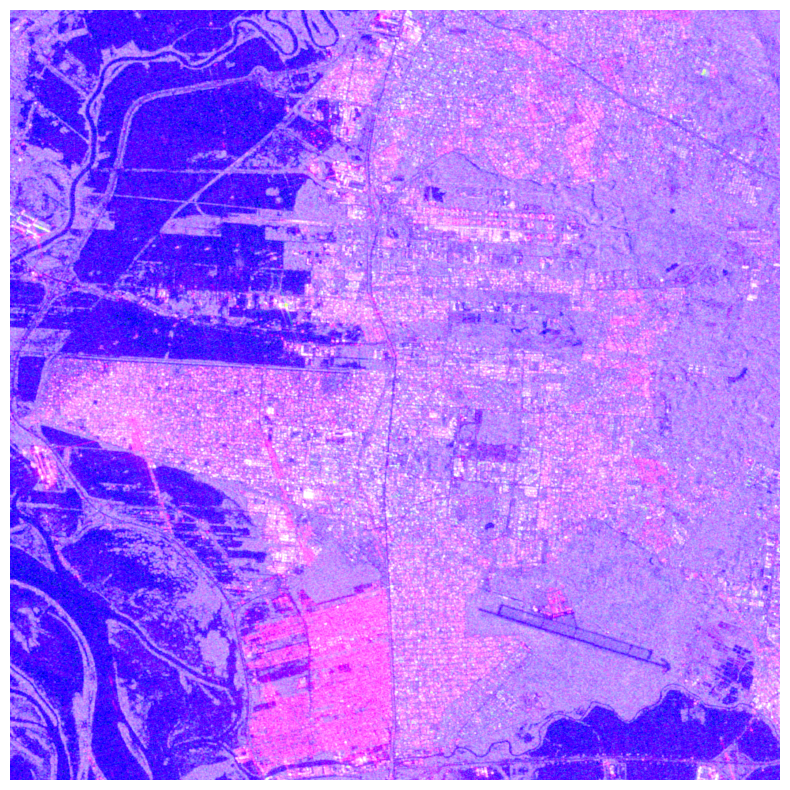

In [8]:
# Load the images into a grid (row-wise)
tiles = []

for i in range(cols):  # Assuming col represents the number of columns
    col_tiles = []
    for j in range(rows):  # Assuming row represents the number of rows
        filename = f"{file_pattern}_{j}_{i}.png"
        img = Image.open(os.path.join(image_folder, filename))
        col_tiles.append(img)
    tiles.append(col_tiles)

# Get the size of each tile (assuming all tiles are of the same size)
tile_width, tile_height = tiles[0][0].size

# Calculate the total width and height of the stitched image
full_height = rows * tile_height  # Height should be based on rows
full_width = cols * tile_width  # Width should be based on columns

# Create a blank image for the full grid
full_image = Image.new('RGB', (full_width, full_height))  # Use correct width and height

# Paste each row of images into the full image
y_offset = 0
for row_list in tiles:
    x_offset = 0
    for sing_img in row_list:
        full_image.paste(sing_img, (y_offset, x_offset))
        x_offset += tile_width
    y_offset += tile_height

# Convert the stitched image to a format suitable for plotting
full_image_np = np.array(full_image)

# Plot the stitched image
plt.figure(figsize=(rows*10/3, cols*10/3))
plt.imshow(full_image_np)
plt.axis('off')  # Turn off the axis
plt.show()

Now, creating the map for the outputs

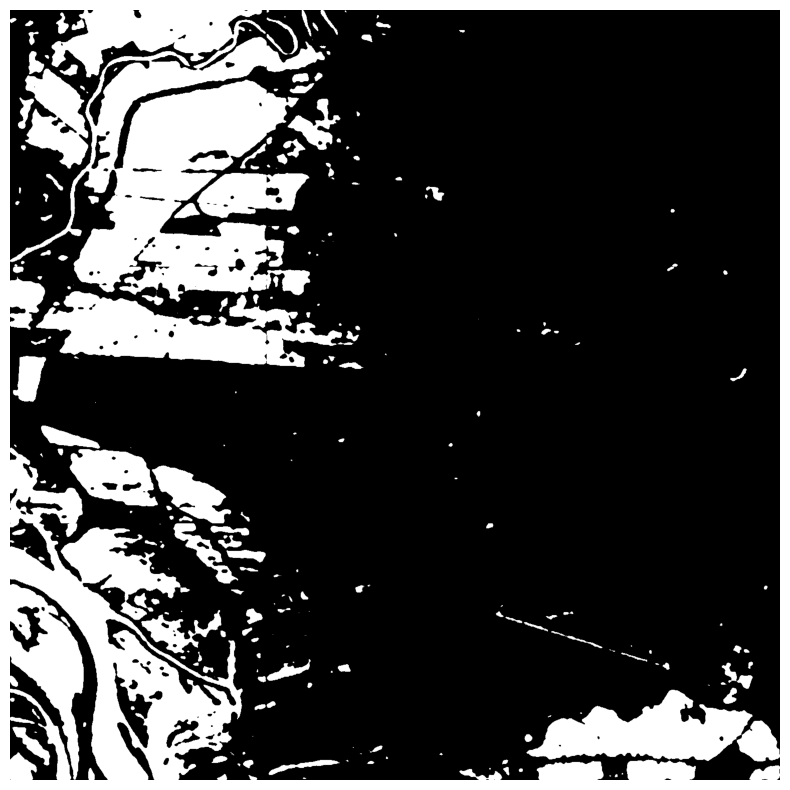

In [9]:
# Load the images into a grid (row-wise)
tiles = []

for i in range(cols):  # Assuming col represents the number of columns
    col_tiles = []
    for j in range(rows):  # Assuming row represents the number of rows
        filename = f"{file_pattern}_{j}_{i}.png"
        img = Image.open(os.path.join(output_folder, filename))
        col_tiles.append(img)
    tiles.append(col_tiles)

# Get the size of each tile (assuming all tiles are of the same size)
tile_width, tile_height = tiles[0][0].size

# Calculate the total width and height of the stitched image
full_width = cols * tile_width  # Width should be based on columns
full_height = rows * tile_height  # Height should be based on rows

# Create a blank image for the full grid
full_image = Image.new('RGB', (full_width, full_height))  # Use correct width and height

# Paste each row of images into the full image


x_offset = 0
for row_list in tiles:
    y_offset = 0
    for sing_img in row_list:
        full_image.paste(sing_img, (x_offset, y_offset))
        y_offset += tile_width
    x_offset += tile_height

# Convert the stitched image to a format suitable for plotting
full_image_np = np.array(full_image)

# Plot the stitched image
plt.figure(figsize=(rows*10/3, cols*10/3))
plt.imshow(full_image_np)
plt.axis('off')  # Turn off the axis
plt.show()

## **Mixing the Maps to Analyze Flooding**

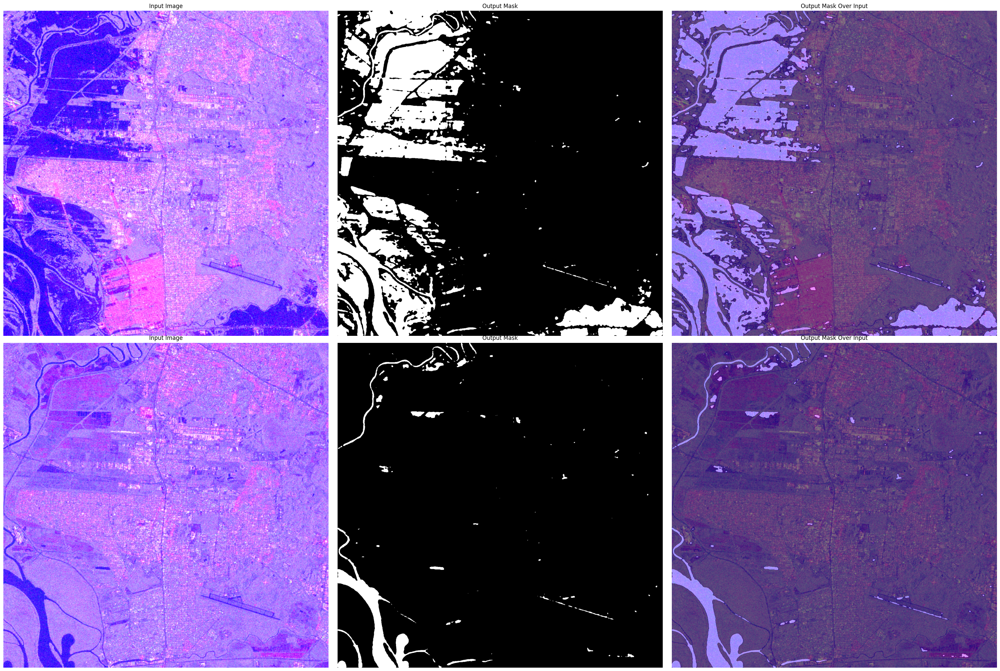

In [10]:
# Load input and output tiles
input_tiles = load_tiles(image_folder, rows, cols, file_pattern)
output_tiles = load_tiles(output_folder, rows, cols, file_pattern)

# No flood
input_tiles_no_flood = load_tiles(no_flood_folder, rows, cols, file_pattern)
output_tiles_no_flood = load_tiles(no_flood_output_folder, rows, cols, file_pattern)

# Stitch input and output images
input_image_np = stitch_images(input_tiles, rows, cols)
output_image_np = stitch_images(output_tiles, rows, cols)

input_image_np_no_flood = stitch_images(input_tiles_no_flood, rows, cols)
output_image_np_no_flood = stitch_images(output_tiles_no_flood, rows, cols)

# Create a composite image by overlaying the output mask on the input
# For overlay, we assume the output mask is grayscale or has a transparency channel
output_image_overlay = Image.fromarray(output_image_np).convert("RGBA")
input_image_overlay = Image.fromarray(input_image_np).convert("RGBA")
output_image_overlay_no_flood = Image.fromarray(output_image_np_no_flood).convert("RGBA")
input_image_overlay_no_flood = Image.fromarray(input_image_np_no_flood).convert("RGBA")

# Blend the images (adjust the alpha for transparency of the mask)
blended_image = Image.blend(input_image_overlay, output_image_overlay, alpha=0.5)
blended_image_no_flood = Image.blend(input_image_overlay_no_flood, output_image_overlay_no_flood, alpha=0.5)

# Plot the input, output, and composite (overlaid) images
fig, axs = plt.subplots(2, 3, figsize=(3 * rows*10/3, 2 * cols*10/3))

# Plot input image
axs[0][0].imshow(input_image_np)
axs[0][0].set_title('Input Image')
axs[0][0].axis('off')

# Plot output image
axs[0][1].imshow(output_image_np)
axs[0][1].set_title('Output Mask')
axs[0][1].axis('off')

# Plot blended image (output mask over input)
axs[0][2].imshow(np.array(blended_image))
axs[0][2].set_title('Output Mask Over Input')
axs[0][2].axis('off')

axs[1][0].imshow(input_image_np_no_flood)
axs[1][0].set_title('Input Image')
axs[1][0].axis('off')

# Plot output image
axs[1][1].imshow(output_image_np_no_flood)
axs[1][1].set_title('Output Mask')
axs[1][1].axis('off')

# Plot blended image (output mask over input)
axs[1][2].imshow(np.array(blended_image_no_flood))
axs[1][2].set_title('Output Mask Over Input')
axs[1][2].axis('off')

plt.tight_layout()
plt.show()

# **Flood Difference**

To be able to measure the impact of the flooding, we will use the approach of subtracting the prediction of the model in images with and without flooding. In this way, we remove the permanent bodies of water of any region.

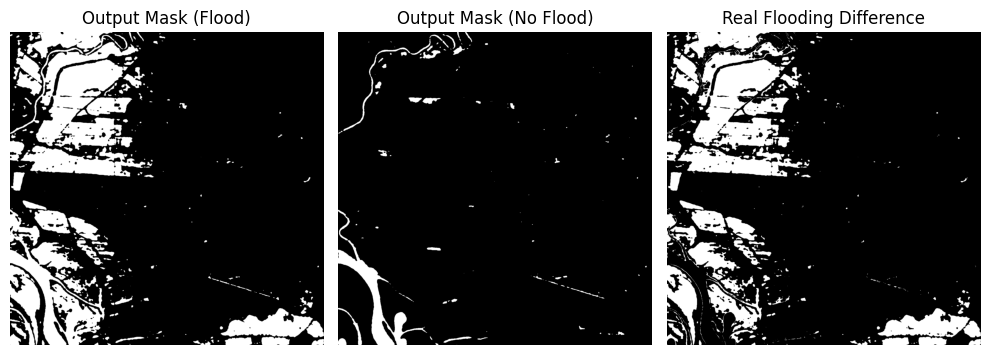

In [11]:
# Subtract the "no flood" mask from the flood mask to get the real flooding areas
flood_difference = np.array(output_image_np, dtype=np.int32) - np.array(output_image_np_no_flood, dtype=np.int32)

# Clip the result to ensure no negative values
flood_difference = np.clip(flood_difference, 0, 255).astype(np.uint8)

# Convert back to an image format for plotting
flood_difference_image = Image.fromarray(flood_difference)

# Plot the output mask (flood), output mask (no flood), and the difference
fig, axs = plt.subplots(1, 3, figsize=(rows*10/3, 3 * cols*10/3))

# Plot output mask with flood
axs[0].imshow(output_image_np, cmap='gray')
axs[0].set_title('Output Mask (Flood)')
axs[0].axis('off')

# Plot output mask with no flood
axs[1].imshow(output_image_np_no_flood, cmap='gray')
axs[1].set_title('Output Mask (No Flood)')
axs[1].axis('off')

# Plot the difference (real flooding areas)
axs[2].imshow(flood_difference_image, cmap='gray')
axs[2].set_title('Real Flooding Difference')
axs[2].axis('off')

plt.tight_layout()
plt.show()

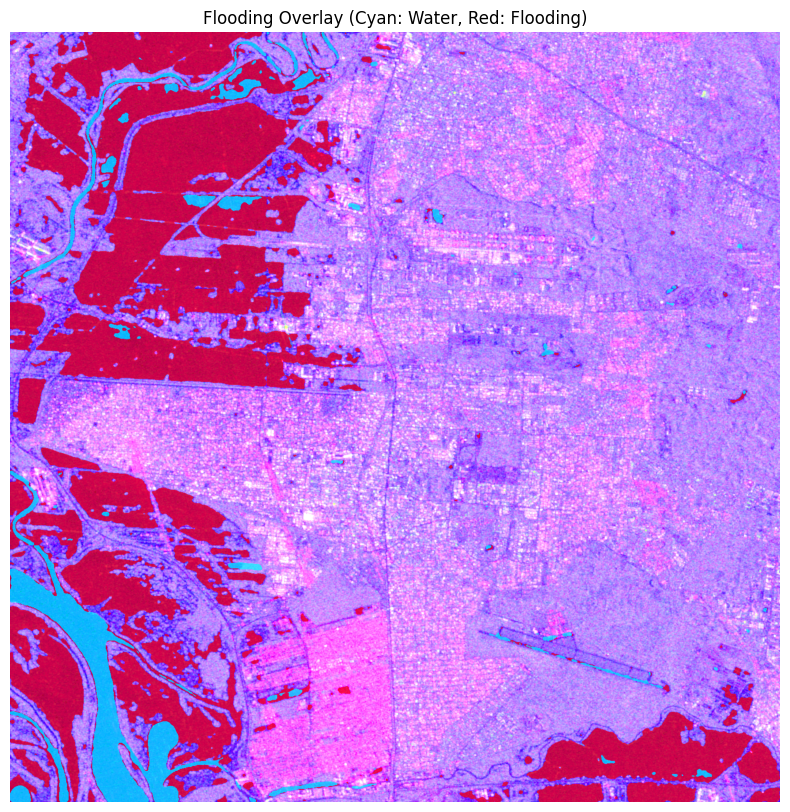

In [12]:
# Convert images to numpy arrays for comparison (handling RGB)
output_mask_flood = np.array(output_image_np)
output_mask_no_flood = np.array(output_image_np_no_flood)

# Convert the RGB masks to grayscale by averaging across the color channels
output_mask_flood_gray = output_mask_flood.mean(axis=-1)
output_mask_no_flood_gray = output_mask_no_flood.mean(axis=-1)

# Threshold to create binary masks: any pixel with a mean > 0 is considered water/flood
output_mask_flood_binary = (output_mask_flood_gray > 0).astype(np.uint8)
output_mask_no_flood_binary = (output_mask_no_flood_gray > 0).astype(np.uint8)

# Convert input to RGBA to prepare for overlay
input_image_overlay = Image.fromarray(input_image_np).convert("RGBA")

# Create overlay images with custom colors
overlay_image = Image.new("RGBA", input_image_overlay.size)

# Get the drawing context
draw = ImageDraw.Draw(overlay_image)

# Iterate over the mask and draw overlays with your chosen color (cyan for water, red for flooding)
for x in range(output_mask_flood_binary.shape[1]):  # Width
    for y in range(output_mask_flood_binary.shape[0]):  # Height
        if output_mask_no_flood_binary[y, x] > 0:  # Already water, draw cyan
            draw.point((x, y), fill=(0, 255, 255, 180))  # Cyan, semi-transparent
        elif output_mask_flood_binary[y, x] > 0:  # Flooding, draw strong red
            draw.point((x, y), fill=(255, 0, 0, 180))  # Red, semi-transparent

# Blend the overlays onto the original input image
final_image = Image.alpha_composite(input_image_overlay, overlay_image)

# Plot the result
plt.figure(figsize=(rows*10/3, cols*10/3))
plt.imshow(final_image)
plt.title("Flooding Overlay (Cyan: Water, Red: Flooding)")
plt.axis('off')
plt.show()

# **Improving the Predictions**

We can still improve the masks to get new areas affected by using the algorithms detailed in the `mask-aug` module.

The model's output does not get some urban areas, as it seen in the image below:

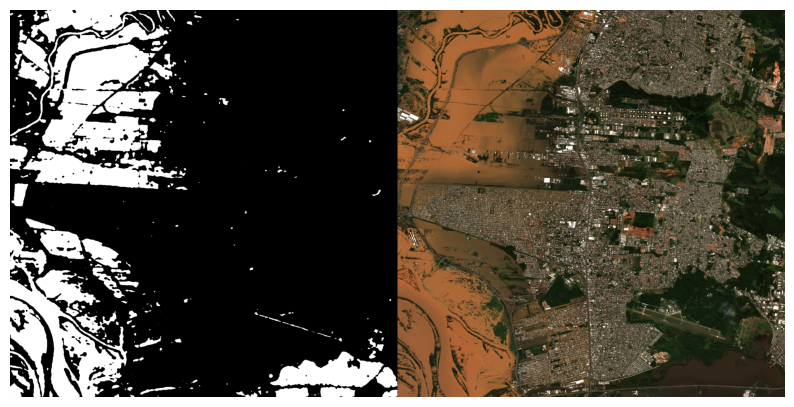

In [18]:
make_map([output_folder, flood_sen2_folder], file_pattern, rows, cols)

In [13]:
improve_mask(flood_sen2_folder, no_flood_output_folder, output_folder, no_flood_sen2_folder, improved_output_folder, file_pattern, rows, cols)

Let's visualize the improvement in the mask:

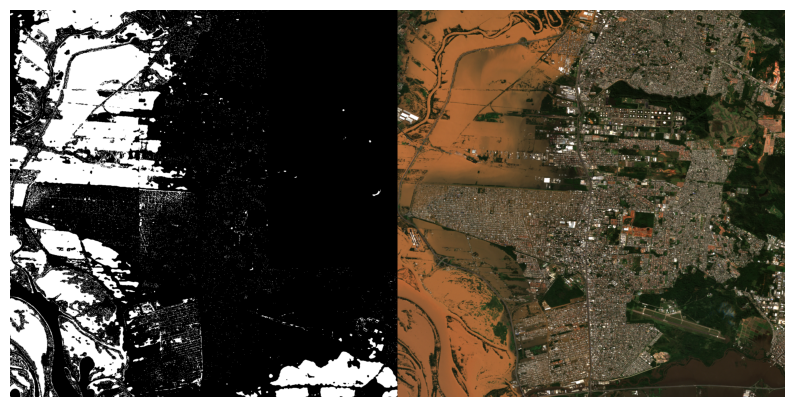

In [17]:
make_map([improved_output_folder, flood_sen2_folder], file_pattern, rows, cols)

In [14]:
for i in range(rows):
    for j in range(cols):
        test = io.imread(f"{improved_output_folder}/{file_pattern}_{i}_{j}.png", as_gray=True)
        
        # clean first then close
        cleaned = clean_image(test, min_area=2)
        closed = close_image(cleaned, disk_size=8)
        io.imsave(f"{final_output_folder}/{file_pattern}_{i}_{j}.png", closed)

In [15]:
tiles_improved = load_tiles(final_output_folder, rows, cols, file_pattern)
improved_image = stitch_images(tiles_improved, rows, cols)

improved_flood_difference = np.array(improved_image, dtype=np.int32)

# Clip the result to ensure no negative values
improved_flood_difference = np.clip(improved_flood_difference, 0, 255).astype(np.uint8)

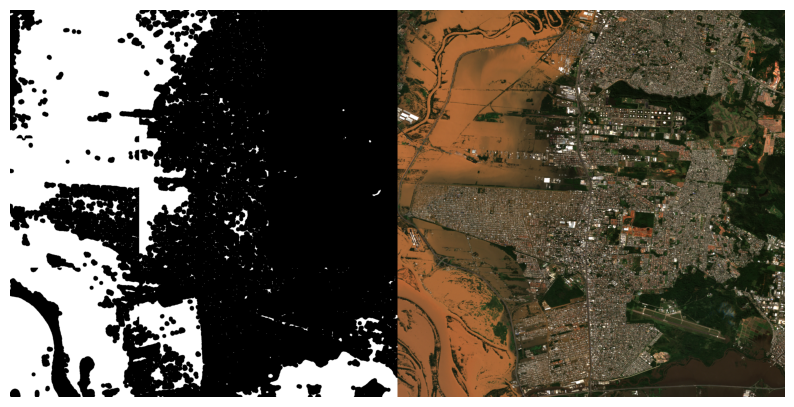

In [16]:
make_map([final_output_folder, flood_sen2_folder], file_pattern, rows, cols)

# **Calculating Affected Populatiton**

For this task, we will use a population density map with a 1km/pixel resolution, and we can have 2 approaches to fit it with the dimensions of our image.

## A. Dilating Map

By “zooming in” the map, we could increase its resolution to match one of the satellite images, spreading the value of the original pixels. In this way, it was possible to overlap the model output directly with the extended map to obtain the estimated affected population. However, this approach trades off the accuracy of the maps and makes them very specific, which does not account for the estimation of the model.

In [20]:
# This must be the entire bbox of the stitched image of all tiles! This is achieved by getting
# the northwest corner of the first tile and southeast of the last one.

# ATTENTION: most API's use the bbox to collect imagery (such as sentinel-downloader) in a NW, SE format.
# For Geopandas, you need to convert it to SW, NE (min lat, min long, max lat, max long) format.
# Otherwise, it will not work. Make sure to input it properly like the example below.

# Bbox for the Canoas example
maxy, minx, miny, maxx = bbox

First, we need to load and zoom in the density map to the desired bbox.

(18, 18)


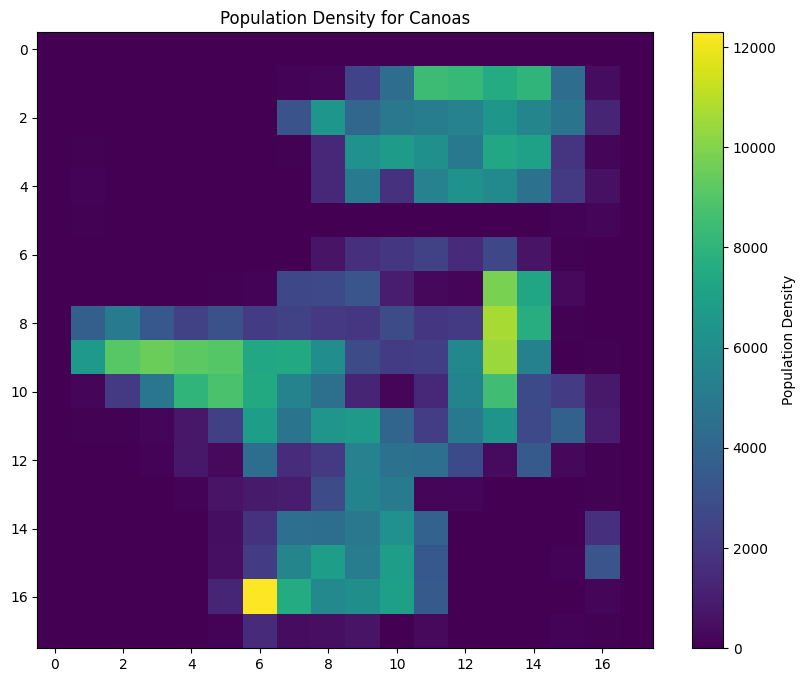

In [21]:
bbox_geom = box(minx, miny, maxx, maxy)
geo = gpd.GeoDataFrame({'geometry': bbox_geom}, index=[0], crs='EPSG:4326')

# Load the population density TIFF file
with rasterio.open(pop_density_path) as src:
    # Reproject the bbox to the same CRS as the population raster
    geo = geo.to_crs(src.crs)
    bbox_geom_proj = [geo.geometry[0]]

    # Clip the population raster to the bbox of Canoas
    out_image, out_transform = mask(src, bbox_geom_proj, crop=True)
    out_meta = src.meta.copy()

    # Update the metadata to match the clipped raster
    out_meta.update({
        "driver": "GTiff",
        "height": out_image.shape[1],
        "width": out_image.shape[2],
        "transform": out_transform
    })

    # Mask no-data values (use src.nodata to check for no-data values)
    # Replace no-data values with 0
    if src.nodata is not None:
        out_image = np.where(out_image == src.nodata, 0, out_image)

    non_zero_rows = np.any(out_image[0] != '--', axis=1)  # Rows that are not all 0
    non_zero_cols = np.any(out_image[0] != '--', axis=0)  # Columns that are not all 0

    # Trim the array to exclude rows and columns that are all 0
    trimmed_image = out_image[0][non_zero_rows, :][:, non_zero_cols]

print(trimmed_image.shape)

# Plot the clipped population density for Canoas
plt.figure(figsize=(10, 8))
plt.imshow(trimmed_image, cmap='viridis')   
plt.colorbar(label='Population Density')
plt.title('Population Density for Canoas')
plt.show()

However, this image is way smaller than our prediction map of all tiles. For that, we will expand the density map averaging the pixel values:

1536 1536
Upscaled population density shape: (1536, 1536)


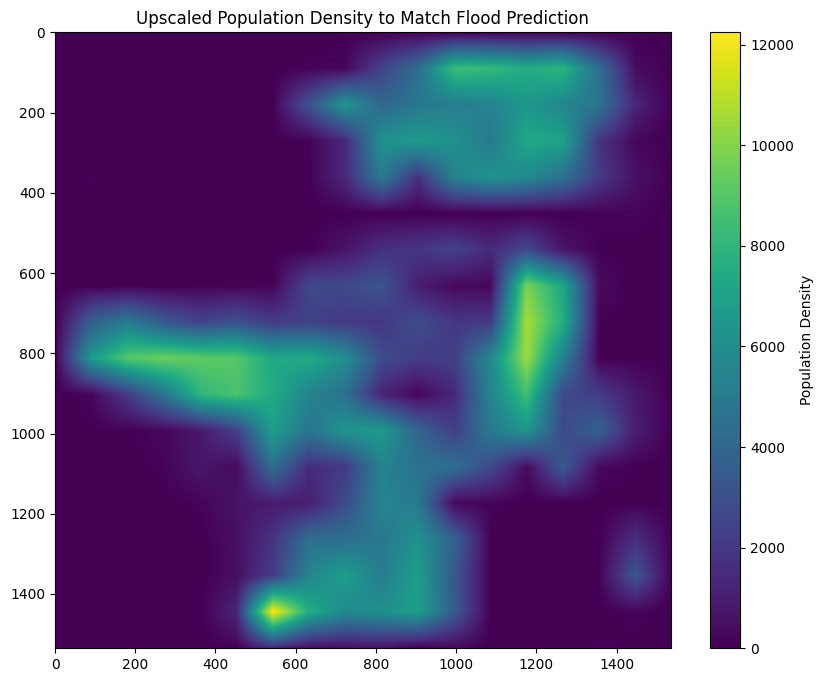

In [22]:
pop_density = np.squeeze(trimmed_image)  # Remove the extra dimension

print(full_height, full_width)

# Use scipy's zoom function to upscale the population density from (13, 17) to (1536, 1536)
scale_y = full_height / pop_density.shape[0]  # Vertical scale factor
scale_x = full_width / pop_density.shape[1]  # Horizontal scale factor
upscaled_density = zoom(pop_density, (scale_y, scale_x), order=1)  # Bilinear interpolation

print("Upscaled population density shape:", upscaled_density.shape)

# Visualize the upscaled population density
plt.figure(figsize=(10, 8))
plt.imshow(upscaled_density, cmap='viridis')
plt.colorbar(label='Population Density')
plt.title('Upscaled Population Density to Match Flood Prediction')
plt.show()

To calculate the flood mask, we will simply make sure that 1 stays for flooding and 0 stays for no-flooding. Therefore, we can multiply the maps and achieve our final affected population (converting the resolutions from 10m/pixel and 1km/pixel)

In [23]:
flood_mask = np.mean(improved_flood_difference, axis=-1)

flood_mask = flood_mask[:full_height, :full_width]

# Clip the values to ensure it's a binary mask (0 or 1)
flood_mask = np.clip(flood_mask, 0, 1)

print(flood_mask.shape) 

(1536, 1536)


We will divide by 10000 as it is the factor to convert between $100m^2$/pixel and $1000000m^2$/pixel

In [24]:
affected_population = flood_mask * (upscaled_density/10000)

# Sum the total affected population
total_affected_population = np.sum(affected_population)

print(f"Total Estimated Affected Population: {total_affected_population}")

Total Estimated Affected Population: 66935.05979018773


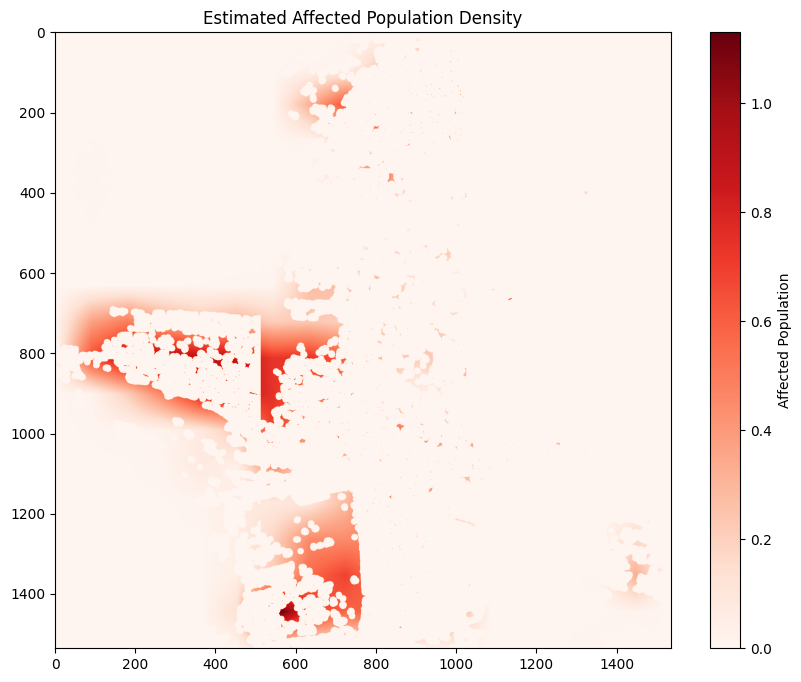

In [26]:
# Plot the affected population density
plt.figure(figsize=(10, 8))
plt.imshow(affected_population, cmap='Reds')
plt.colorbar(label='Affected Population')
plt.title('Estimated Affected Population Density')
plt.show()

## B. Using Thresholds

We can also use a threshold to estimate the population! If more than a percentage of the mask pixels that correspond to a 1km² pixel of the map are marked as flooded, the entire area can be considered affected. In that way, we build a smaller image, marking each pixel as affected or not instead of dilating the density map. Then, the population can be estimated by adding the population of each pixel and dividing by 10,000 to account for the ratio of the 1km² to the old 100m² area.

(np.float64(-0.5), np.float64(17.5), np.float64(17.5), np.float64(-0.5))

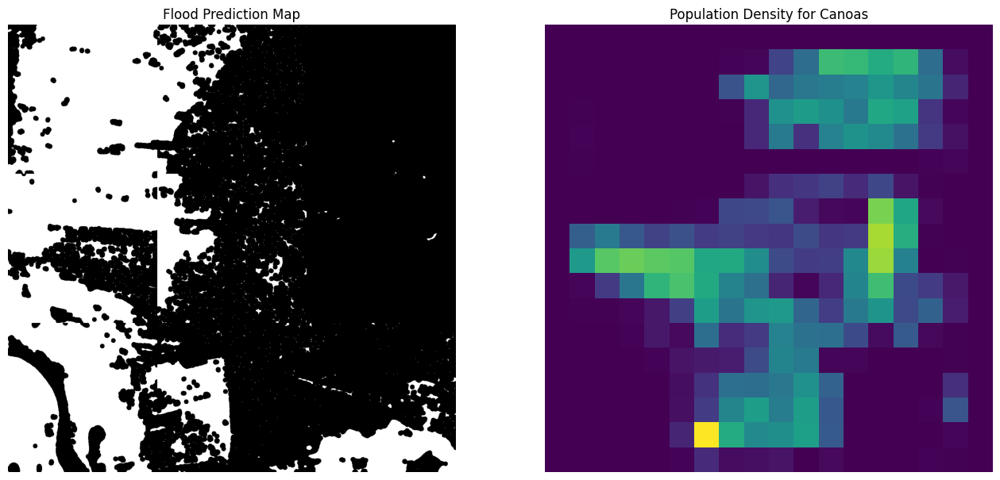

In [32]:
# Load your flood prediction map here (assuming it’s in a variable called flood_prediction)
flood_shape = flood_mask.shape  # e.g., (1536, 1536)
block_size_y = flood_shape[0] // trimmed_image.shape[0]  # Height of each block
block_size_x = flood_shape[1] // trimmed_image.shape[1]  # Width of each block

# Initialize an empty matrix to store the results
affected_pixels_10 = np.zeros(trimmed_image.shape, dtype=int)
affected_pixels_20 = np.zeros(trimmed_image.shape, dtype=int)
affected_pixels_30 = np.zeros(trimmed_image.shape, dtype=int)

# Threshold for affected blocks (e.g., 30%)
threshold_10 = 0.1
threshold_20 = 0.2
threshold_30 = 0.3

# Loop through each cell in the population density grid
for i in range(trimmed_image.shape[0]):
    for j in range(trimmed_image.shape[1]):
        # Extract the corresponding block in the flood prediction map
        block = flood_mask[
            i * block_size_y:(i + 1) * block_size_y,
            j * block_size_x:(j + 1) * block_size_x
        ]
        
        # Calculate the proportion of flooded pixels (pixels with value 1)
        flooded_proportion = np.mean(block == 1)
        
        # Mark the population density cell as affected if it meets the threshold
        if flooded_proportion >= threshold_10:
            affected_pixels_10[i, j] = 1

        if flooded_proportion >= threshold_20:
            affected_pixels_20[i, j] = 1

        if flooded_proportion >= threshold_30:
            affected_pixels_30[i, j] = 1

fig, axes = plt.subplots(1, 2, figsize=(16, 12))

# First row
axes[0].imshow(flood_mask, cmap="gray")
axes[0].set_title('Flood Prediction Map')
axes[0].axis('off')

axes[1].imshow(trimmed_image, cmap='viridis')
axes[1].set_title('Population Density for Canoas')
axes[1].axis('off')


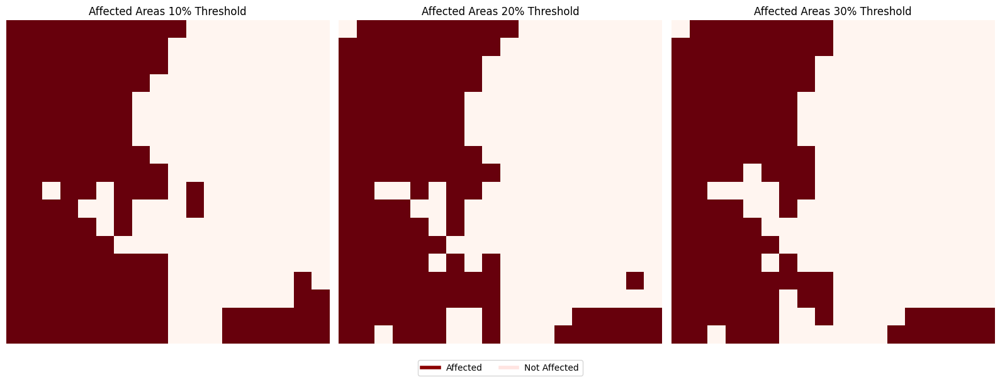

In [44]:
fig, axes = plt.subplots(1, 3, figsize=(16, 6))

# Plot the three images
im0 = axes[0].imshow(affected_pixels_10, cmap='Reds', vmin=0, vmax=1)
axes[0].set_title('Affected Areas 10% Threshold')
axes[0].axis('off')

im1 = axes[1].imshow(affected_pixels_20, cmap='Reds', vmin=0, vmax=1)
axes[1].set_title('Affected Areas 20% Threshold')
axes[1].axis('off')

im2 = axes[2].imshow(affected_pixels_30, cmap='Reds', vmin=0, vmax=1)
axes[2].set_title('Affected Areas 30% Threshold')
axes[2].axis('off')

# Add a legend below the plots
legend_elements = [
    plt.Line2D([0], [0], color='darkred', lw=4, label='Affected'),
    plt.Line2D([0], [0], color='mistyrose', lw=4, label='Not Affected')
]

fig.legend(handles=legend_elements, loc='lower center', ncol=2, bbox_to_anchor=(0.5, -0.05))
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust space for the legend
plt.show()


In [30]:
# Calculating the affected population for both thresholds
affected_population_30 = affected_pixels_30 * trimmed_image
affected_population_20 = affected_pixels_20 * trimmed_image
affected_population_10 = affected_pixels_10 * trimmed_image

# Sum the total affected population
total_affected_population_30 = np.sum(affected_population_30)
total_affected_population_20 = np.sum(affected_population_20)
total_affected_population_10 = np.sum(affected_population_10)

print(f"Total Estimated Affected Population OPTIMISTIC (30%): {total_affected_population_30}")
print(f"Total Estimated Affected Population NEUTRAL (20%): {total_affected_population_20}")
print(f"Total Estimated Affected Population PESSIMISTIC (10%): {total_affected_population_10}")

Total Estimated Affected Population OPTIMISTIC (30%): 97867.98872031271
Total Estimated Affected Population NEUTRAL (20%): 125590.40052451193
Total Estimated Affected Population PESSIMISTIC (10%): 176683.6327021271


## Calculating Affected Area

Another important metric is the affected area, that can be calculated by using the amount of affected pixels for each threshold and take the average.

In [46]:
pixels_affected = (np.sum(affected_pixels_30) + np.sum(affected_pixels_10))/2
total_pixels = trimmed_image.shape[0] * trimmed_image.shape[1]

percentage_affected_pixels = pixels_affected/total_pixels

print(f"Percentage of affected pixels: {percentage_affected_pixels:.2f}")
print(f"Affected area (km²): {pixels_affected}")

Percentage of affected pixels: 0.46
Affected area (km²): 147.5


For the Canoas example, we can compare to the official governamental estimations:

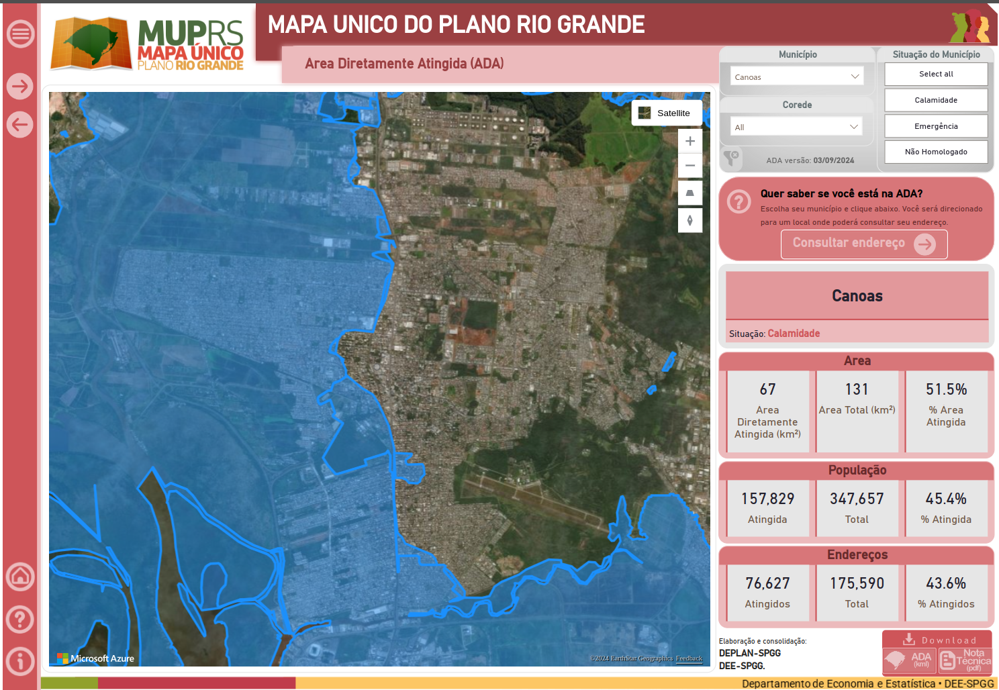

Congrats! You reached the end of our experiment :)